# Temperature Forecast Project using ML

# Project Description

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

#### Attribute Information:

1. station - used weather station number: 1 to 25


2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')


3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6


4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9


5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5


6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100


7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5


8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6


9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9


10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4


11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97


12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97


13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98


14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97


15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7


16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6


17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8


18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7


19. lat - Latitude (Â°): 37.456 to 37.645


20. lon - Longitude (Â°): 126.826 to 127.135


21. DEM - Elevation (m): 12.4 to 212.3


22. Slope - Slope (Â°): 0.1 to 5.2


23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9


24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9


25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T




You have to build separate models that can predict the minimum temperature for the next day and the maximum temperature for the next day based on the details provided in the dataset

# Importing Libraries

In [74]:
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
import sklearn 
import scipy 
import warnings 
warnings.filterwarnings('ignore')

# Importing Dataset

In [75]:
df=pd.read_csv('temperature project.csv')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [76]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


Top 5 rows of the dataset

In [77]:
df.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


Last 5 rows of the dataset

In [78]:
df.shape

(7752, 25)

This dataset has 7752 rows and 25 columns 

# Exploratory Data Analysis [EDA]

In [79]:
df.columns.to_list()

['station',
 'Date',
 'Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'LDAPS_CC1',
 'LDAPS_CC2',
 'LDAPS_CC3',
 'LDAPS_CC4',
 'LDAPS_PPT1',
 'LDAPS_PPT2',
 'LDAPS_PPT3',
 'LDAPS_PPT4',
 'lat',
 'lon',
 'DEM',
 'Slope',
 'Solar radiation',
 'Next_Tmax',
 'Next_Tmin']

List of all the columns present in the dataset

In [80]:
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

The dataset has two types of data ['object', 'float64'] present 

In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


Here we can see total number of null value data type present in the columns, name of columns memory occupied by the dataset.

# Checking For Duplicate Values

In [82]:
df.duplicated().sum()

0

As we can see here that there are no duplicate value present in the dataset.

# Checking for white space

In [83]:
# Check for white spaces
has_white_spaces = ' ' in df
print(has_white_spaces)

False


We can say that there is no white space available in the dataset.

# Checking For Null Values 

In [84]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

Null values are present in the dataset 


Columns['Present_Tmax','Present_Tmin','LDAPS_RHmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4',] have 70+ null values present.


Columns['Next_Tmax', 'Next_Tmin'] have 27 naull values present in the data set & columns['station', 'Date '] have 2 null values present. 


So we have to treat null values first.

<AxesSubplot:>

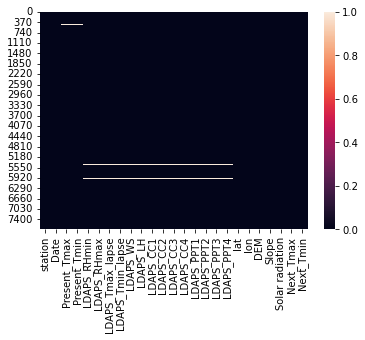

In [85]:
#Visualization for null values
sns.heatmap(df.isnull())

By visualizing with heatmap we can see that white lines are showing  null values are present in the dataset.

# Treating Null Values

Here we use mean method to fill null values present in the dataset

In [86]:
df['Present_Tmax'].fillna(value=df['Present_Tmax'].mean(), inplace= True)
df['Present_Tmin'].fillna(value=df['Present_Tmin'].mean(), inplace= True)
df['LDAPS_RHmin'].fillna(value=df['LDAPS_RHmin'].mean(), inplace= True)
df['LDAPS_RHmax'].fillna(value=df['LDAPS_RHmax'].mean(), inplace= True)
df['LDAPS_Tmax_lapse'].fillna(value=df['LDAPS_Tmax_lapse'].mean(), inplace= True)
df['LDAPS_Tmin_lapse'].fillna(value=df['LDAPS_Tmin_lapse'].mean(), inplace= True)
df['LDAPS_WS'].fillna(value=df['LDAPS_WS'].mean(), inplace= True)
df['LDAPS_LH'].fillna(value=df['LDAPS_LH'].mean(), inplace= True)
df['LDAPS_CC1'].fillna(value=df['LDAPS_CC1'].mean(), inplace= True)
df['LDAPS_CC2'].fillna(value=df['LDAPS_CC2'].mean(), inplace= True)
df['LDAPS_CC3'].fillna(value=df['LDAPS_CC3'].mean(), inplace= True)
df['LDAPS_CC4'].fillna(value=df['LDAPS_CC4'].mean(), inplace= True)
df['LDAPS_PPT1'].fillna(value=df['LDAPS_PPT1'].mean(), inplace= True)
df['LDAPS_PPT1'].fillna(value=df['LDAPS_PPT1'].mean(), inplace= True)
df['LDAPS_PPT2'].fillna(value=df['LDAPS_PPT2'].mean(), inplace= True)
df['LDAPS_PPT3'].fillna(value=df['LDAPS_PPT3'].mean(), inplace= True)
df['LDAPS_PPT4'].fillna(value=df['LDAPS_PPT4'].mean(), inplace= True)
df['Next_Tmax'].fillna(value=df['Next_Tmax'].mean(), inplace= True)
df['Next_Tmin'].fillna(value=df['Next_Tmin'].mean(), inplace= True)
df['station'].fillna(value=df['station'].mean(), inplace= True)

In [87]:
df['Date'] = pd.to_datetime(df['Date'])

In [88]:
df['Date'].fillna(value=df['station'].median(), inplace= True)

In [89]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

There are no null values present in the data set 

<AxesSubplot:>

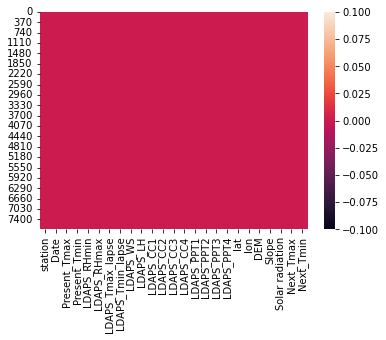

In [90]:
#Visualization for null values
sns.heatmap(df.isnull())

By visualizing with heatmap we can say that there are no null values present in the dataset 

# Description Of The Dataset

In [91]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,...,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.210637,2.956557,2.403036,14.596973,7.157124,2.932898,2.333973,2.173245,33.567001,0.261185,...,1.754258,1.156174,1.200364,0.050352,0.079435,54.279780,1.370444,429.158867,3.122557,2.483276
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,46.046162,84.316923,27.693091,22.114651,5.686487,37.532764,0.148321,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.400000
50%,13.000000,29.900000,23.400000,55.313244,89.699505,29.662273,23.735942,6.563068,57.310630,0.320110,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,...,0.024276,0.009697,0.000693,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


### Observation

1. Count for all the rows is same which means that there are no null values present in the dataset.


2. In most of the columns mean is almost equal to the median so we can say that there may be or may not be prescence of skewness.


3. There is a difference between 75th percentile and max values so outliers are present in the dataset.


4. we can also observe count, mean, std., min, max, 25th, 50th, 75th percentile values of each columns present in the dataset.

# Data Visualization 

### Univarient Analysis 

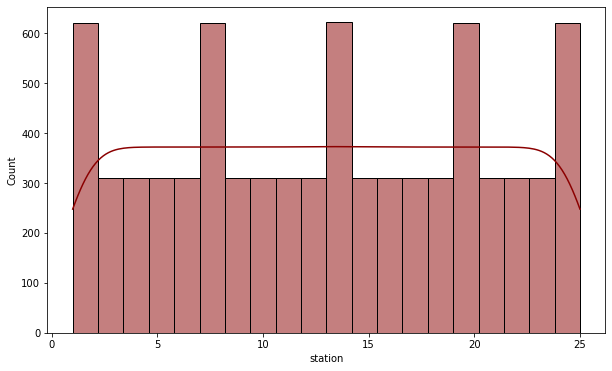

In [92]:
plt.figure(figsize=(10,6))
sns.histplot(df['station'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of station column which is range from 3 to 25

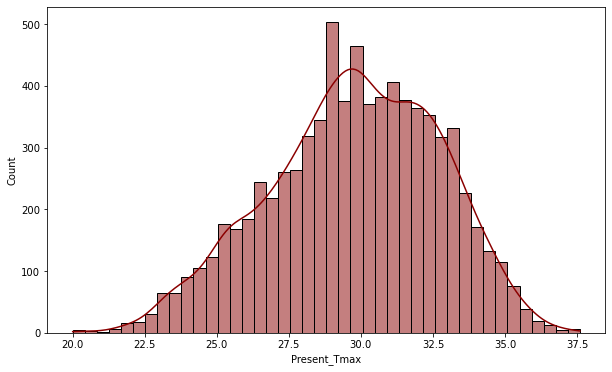

In [93]:
plt.figure(figsize=(10,6))
sns.histplot(df['Present_Tmax'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of present_Tmax column which is range from 20 to 37.5

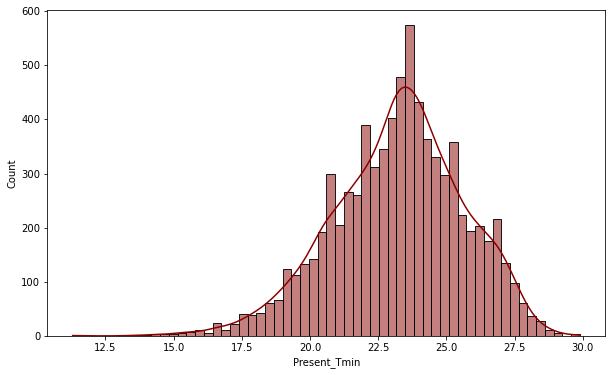

In [94]:
plt.figure(figsize=(10,6))
sns.histplot(df['Present_Tmin'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of present_Tmin column which is range from 12.5 to 30

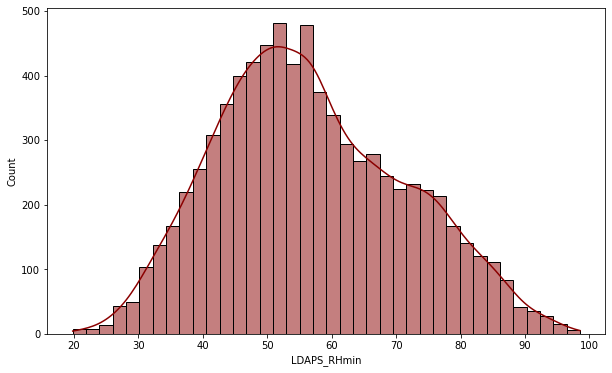

In [95]:
plt.figure(figsize=(10,6))
sns.histplot(df['LDAPS_RHmin'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of LDAPS_RHmin column which is range from 20 to 100

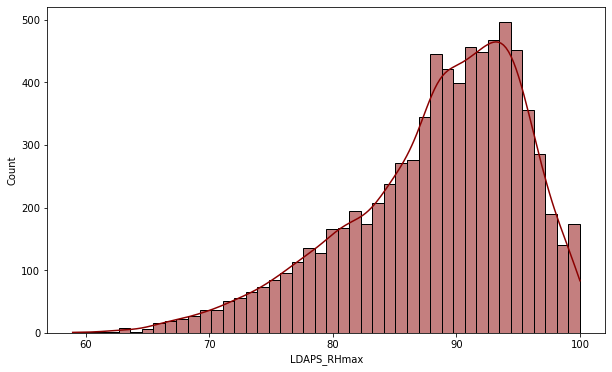

In [96]:
plt.figure(figsize=(10,6))
sns.histplot(df['LDAPS_RHmax'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of LDAPS_RHmax column which is range from 60 to 100

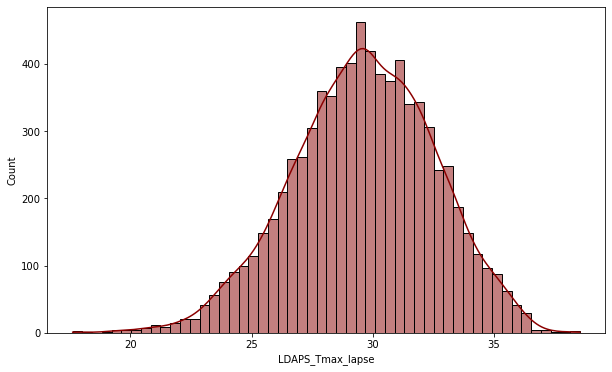

In [97]:
plt.figure(figsize=(10,6))
sns.histplot(df['LDAPS_Tmax_lapse'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of LDAPS_Tmax_lapse column which is range from 20 to 35

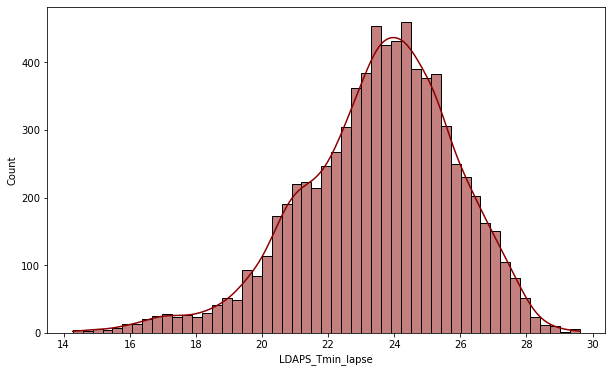

In [98]:
plt.figure(figsize=(10,6))
sns.histplot(df['LDAPS_Tmin_lapse'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of LDAPS_Tmin_lapse column which is range from 14 to 30

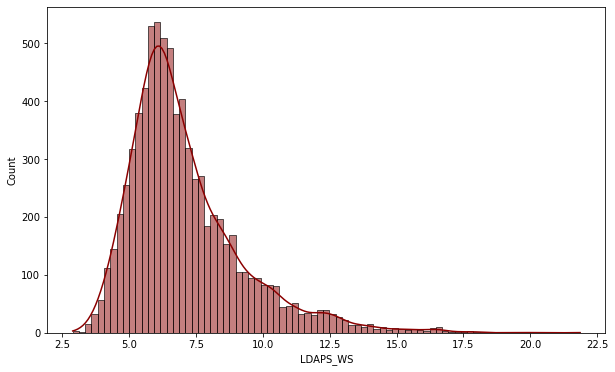

In [99]:
plt.figure(figsize=(10,6))
sns.histplot(df['LDAPS_WS'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of LDAPS_WS column which is range from 2.5 to 20

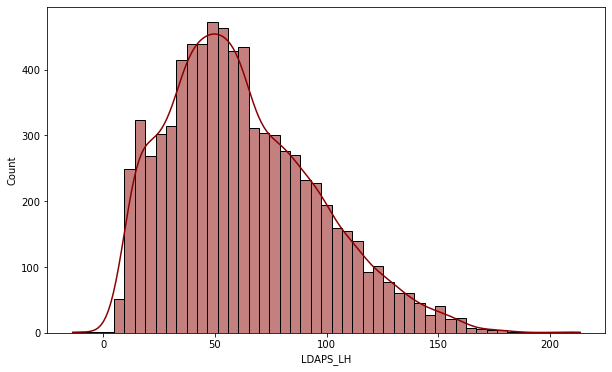

In [100]:
plt.figure(figsize=(10,6))
sns.histplot(df['LDAPS_LH'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of LDAPS_LH column which is range from 0 to 200

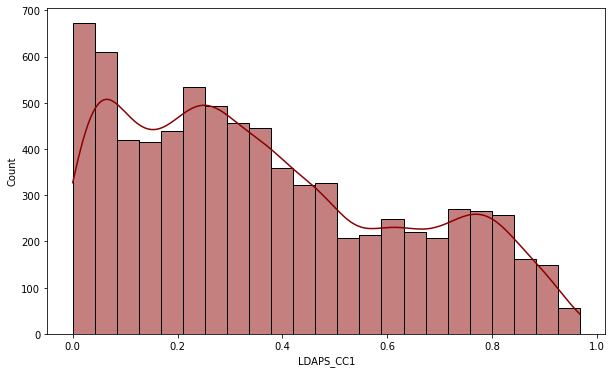

In [101]:
plt.figure(figsize=(10,6))
sns.histplot(df['LDAPS_CC1'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of LDAPS_CC1 column which is range from 0 to 1.0

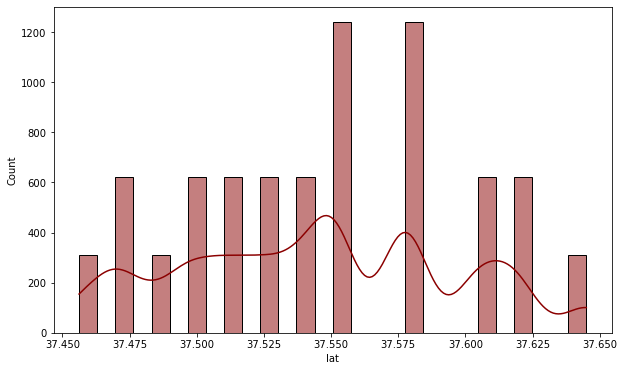

In [102]:
plt.figure(figsize=(10,6))
sns.histplot(df['lat'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of lat column which is range from 37.450 to 37.650

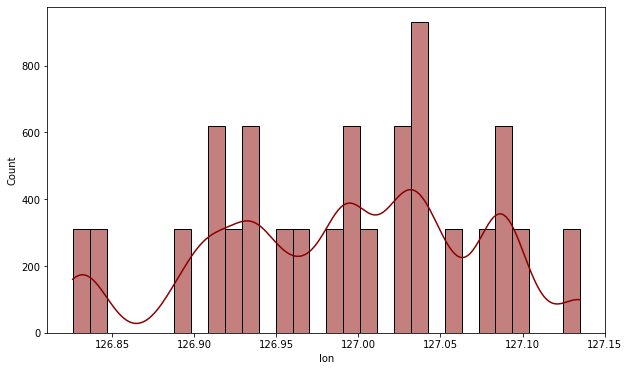

In [103]:
plt.figure(figsize=(10,6))
sns.histplot(df['lon'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of lon column which is range from 126.85 to 127.15

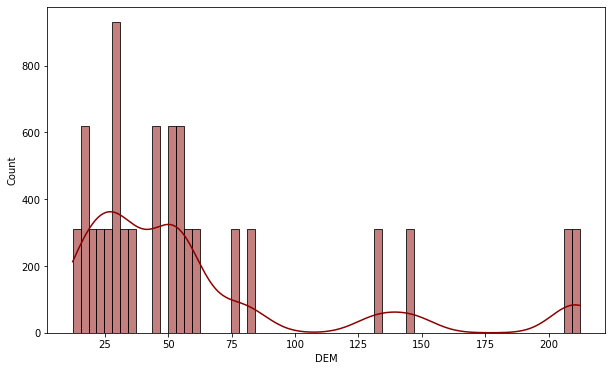

In [104]:
plt.figure(figsize=(10,6))
sns.histplot(df['DEM'], color='darkred', kde=True)
plt.show()

Here we can see the distribustion of DEM column which is range from 25 to 200

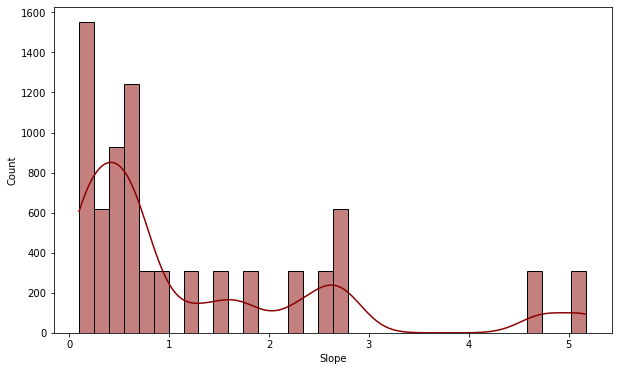

In [105]:
plt.figure(figsize=(10,6))
sns.histplot(df['Slope'], color='darkred', kde=True)
plt.show()

 the distribustion of slope column 

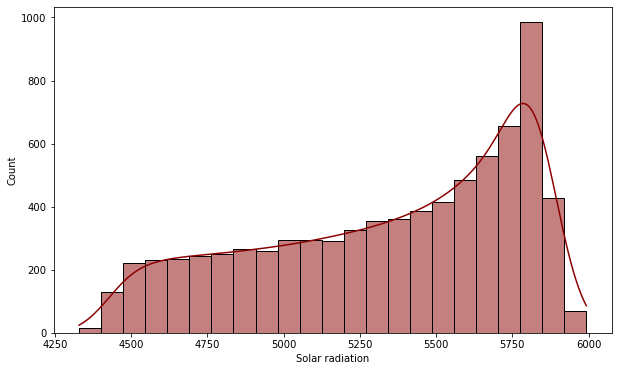

In [106]:
plt.figure(figsize=(10,6))
sns.histplot(df['Solar radiation'], color='darkred', kde=True)
plt.show()

the distribustion of Solar radiation column which is range from 4250 to 6000

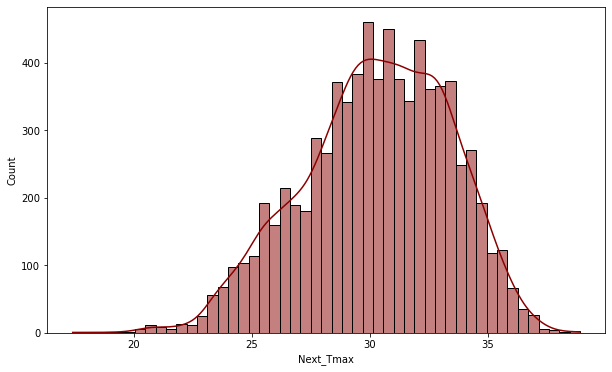

In [107]:
plt.figure(figsize=(10,6))
sns.histplot(df['Next_Tmax'], color='darkred', kde=True)
plt.show()

the distribustion of Next_Tmax column which is range from 20 to 35

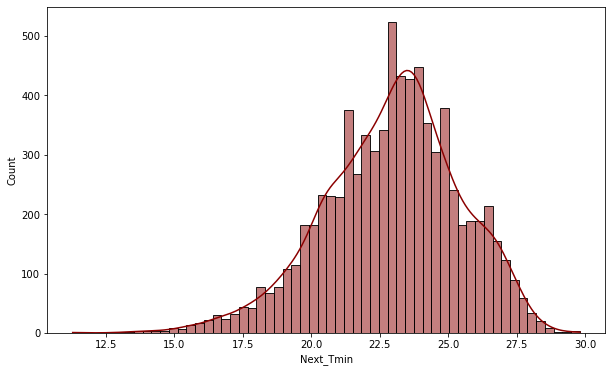

In [108]:
plt.figure(figsize=(10,6))
sns.histplot(df['Next_Tmin'], color='darkred', kde=True)
plt.show()

the distribustion of Next_Tmin column which is range from 12.5 to 30

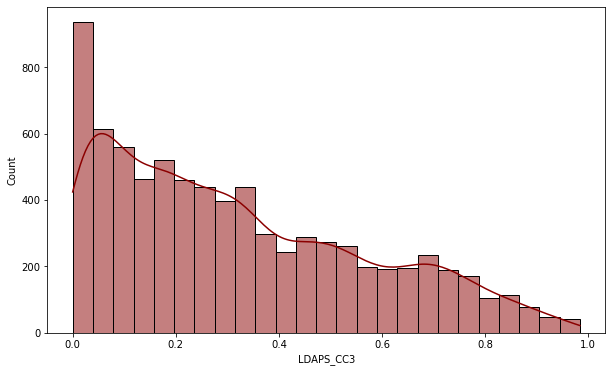

In [109]:
plt.figure(figsize=(10,6))
sns.histplot(df['LDAPS_CC3'], color='darkred', kde=True)
plt.show()

the distribustion of LDAPS_CC3 column which is range from 0 to 1.0

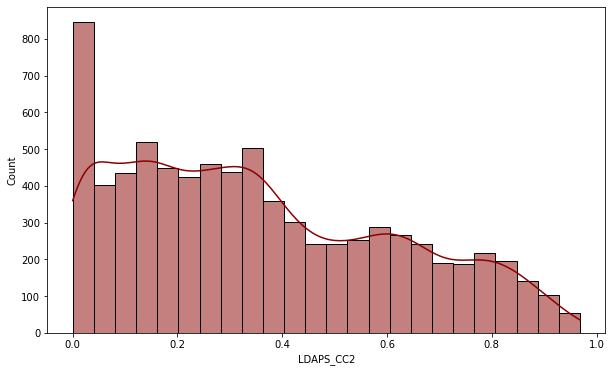

In [110]:
plt.figure(figsize=(10,6))
sns.histplot(df['LDAPS_CC2'], color='darkred', kde=True)
plt.show()

the distribustion of LDAPS_CC2 column which is range from 0 to 1.0

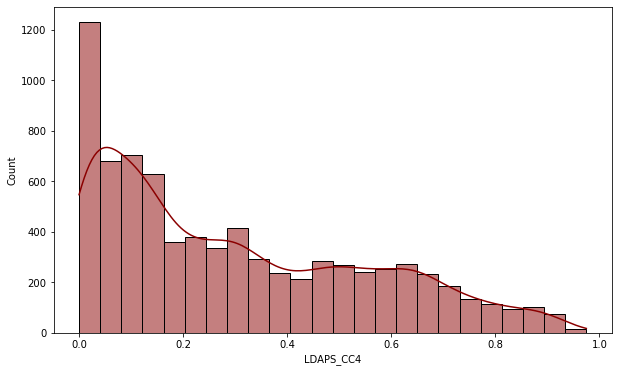

In [111]:
plt.figure(figsize=(10,6))
sns.histplot(df['LDAPS_CC4'], color='darkred', kde=True)
plt.show()

the distribustion of LDAPS_CC4 column which is range from 0 to 1.0

### Bivarient Analysis 

<AxesSubplot:xlabel='Solar radiation', ylabel='Next_Tmax'>

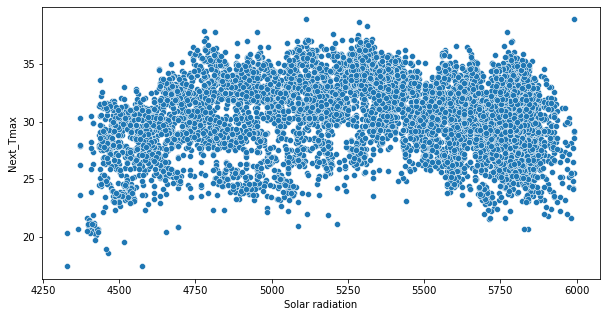

In [112]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['Solar radiation'], df['Next_Tmax'])

comparison between solar radition and nesxt day tmax we can see that with increase in solar radition temp. also increasing 

<AxesSubplot:xlabel='Solar radiation', ylabel='Next_Tmin'>

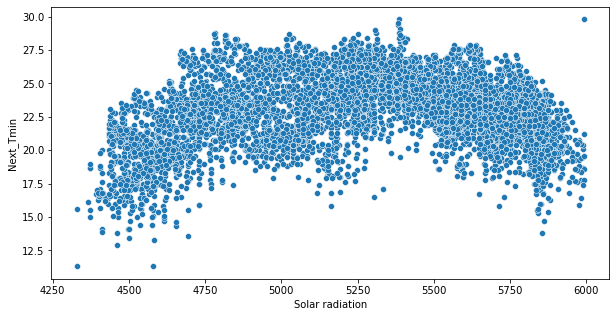

In [113]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['Solar radiation'], df['Next_Tmin'])

comparison between soloar radition and next day tmin we can see that with lower solar radition temp. is also low

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='Next_Tmax'>

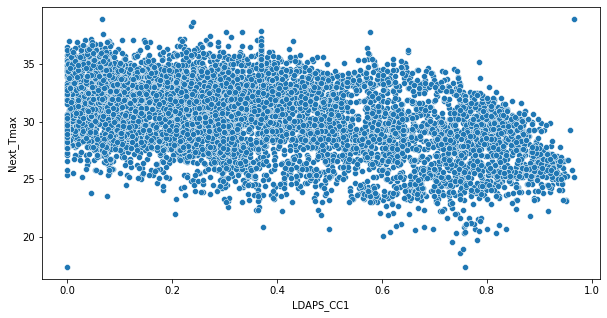

In [114]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_CC1'], df['Next_Tmax'])

As LDAPS_CC1 increase next day tmax. is decreasing 

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='Next_Tmax'>

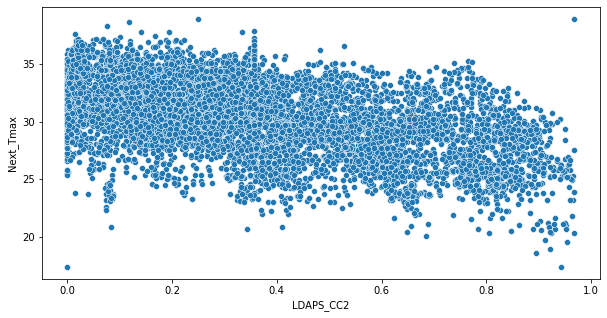

In [115]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_CC2'], df['Next_Tmax'])

As LDAPS_CC2 increase next day tmax. is decreasing 

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Next_Tmax'>

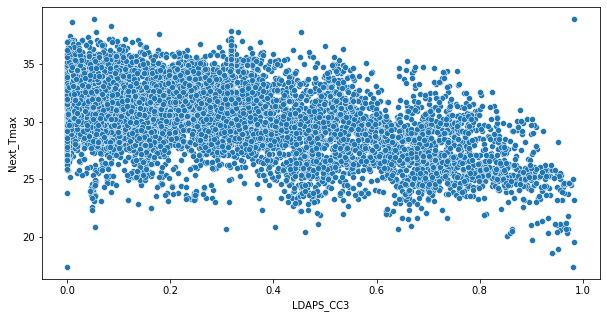

In [116]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_CC3'], df['Next_Tmax'])

As LDAPS_CC3 increase next day tmax. is decreasing 

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='Next_Tmax'>

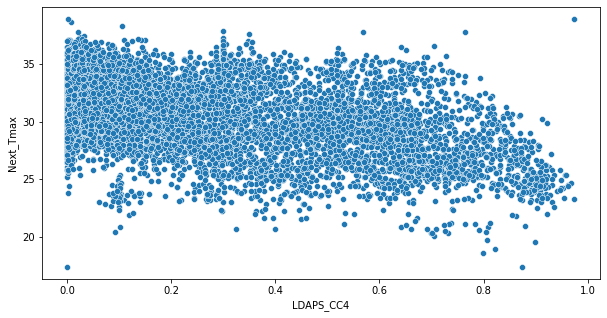

In [117]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_CC4'], df['Next_Tmax'])

As LDAPS_CC4 increase next day tmax. is decreasing 

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='Next_Tmin'>

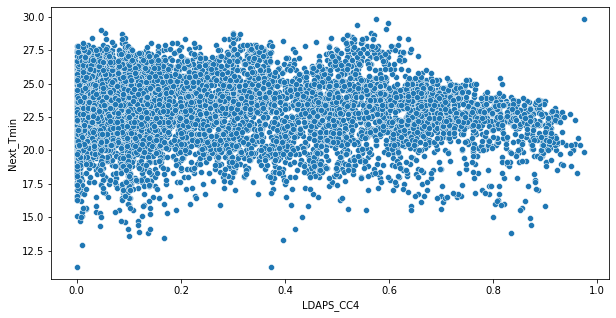

In [118]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_CC4'], df['Next_Tmin'])

As LDAPS_CC1 increase next day tmax. is decreasing 

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Next_Tmin'>

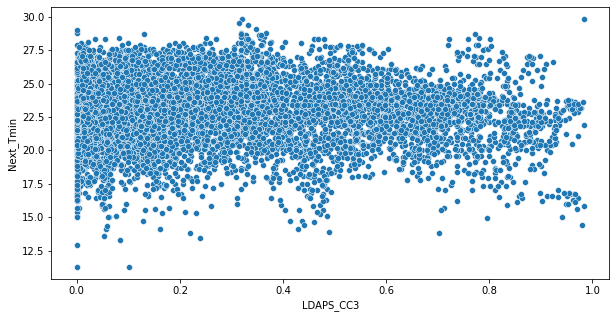

In [119]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_CC3'], df['Next_Tmin'])

scatter plot between LDAPS_CC3 & Next_Tmin

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='Next_Tmin'>

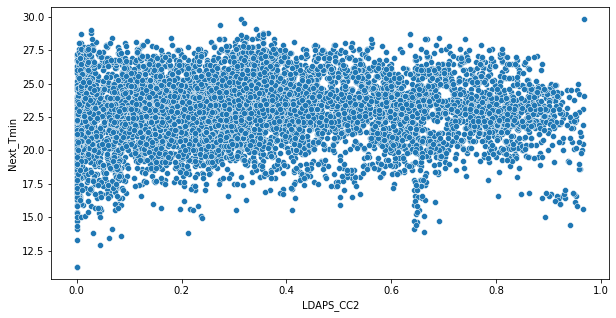

In [120]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_CC2'], df['Next_Tmin'])

scatter plot between LDAPS_CC1 & Next_Tmin

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='Next_Tmin'>

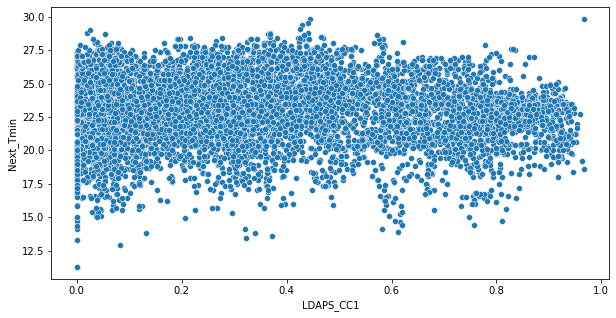

In [121]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_CC1'], df['Next_Tmin'])

scatter plot between LDAPS_CC1 & Next_Tmin

<AxesSubplot:xlabel='Solar radiation', ylabel='Next_Tmin'>

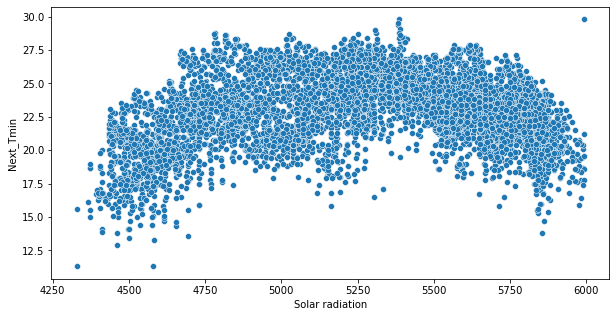

In [122]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['Solar radiation'], df['Next_Tmin'])

scatter plot between Solar radiation & Next_Tmin

<AxesSubplot:xlabel='Solar radiation', ylabel='Next_Tmax'>

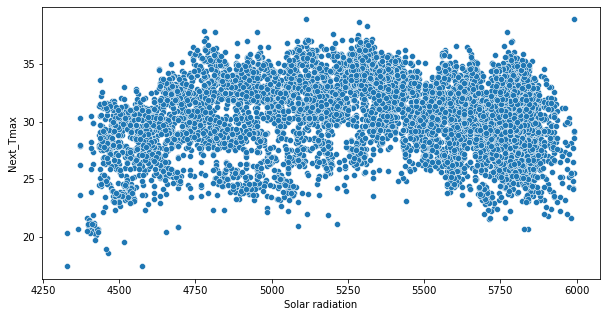

In [123]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['Solar radiation'], df['Next_Tmax'])

scatter plot between Solar radiation & Next_Tmax

<AxesSubplot:xlabel='LDAPS_WS', ylabel='Next_Tmax'>

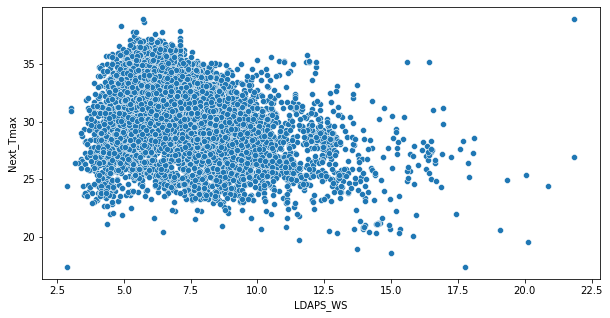

In [124]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_WS'], df['Next_Tmax'])

scatter plot between LDAPS_ws & Next_Tmax

<AxesSubplot:xlabel='LDAPS_WS', ylabel='Next_Tmin'>

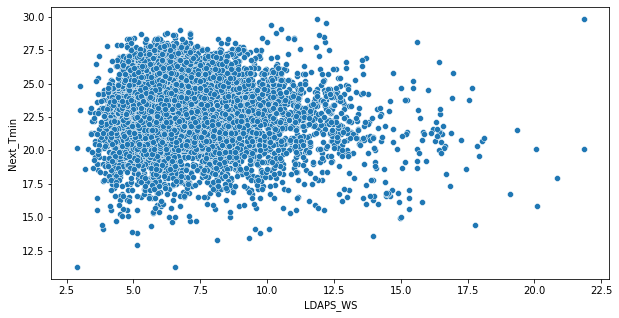

In [125]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_WS'], df['Next_Tmin'])

scatter plot between LDAPS_ws & Next_Tmin

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Next_Tmin'>

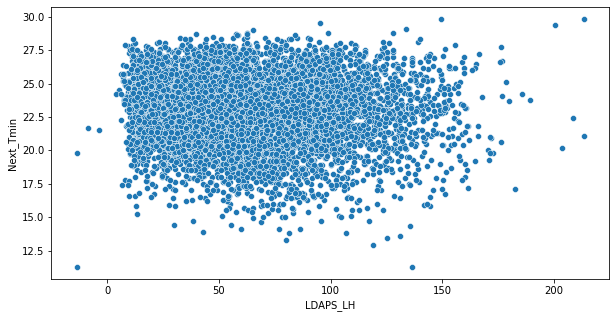

In [126]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_LH'], df['Next_Tmin'])

scatter plot between LDAPS_LH & Next_Tmin

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Next_Tmax'>

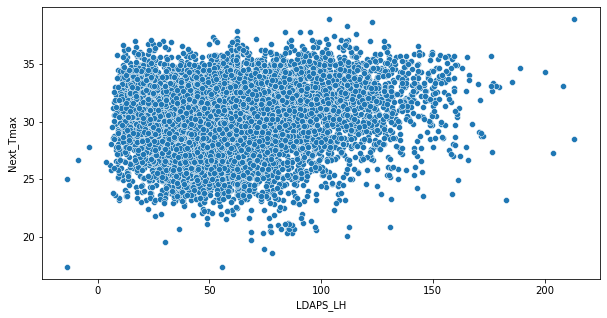

In [127]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_LH'], df['Next_Tmax'])

scatter plot between LDAPS_LH & Next_Tmax 

<AxesSubplot:xlabel='LDAPS_Tmax_lapse', ylabel='Next_Tmax'>

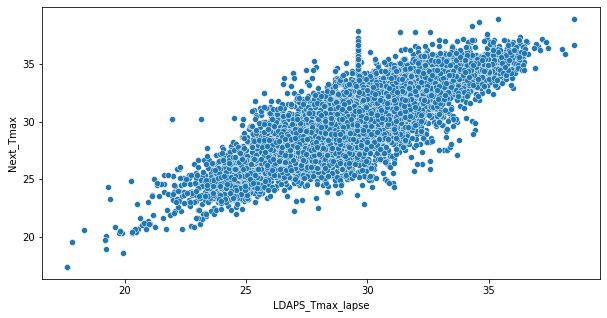

In [128]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_Tmax_lapse'], df['Next_Tmax'])

With increase in LDAPS_Tmax_lapse Next_Tmax is also increasing

<AxesSubplot:xlabel='LDAPS_Tmax_lapse', ylabel='Next_Tmin'>

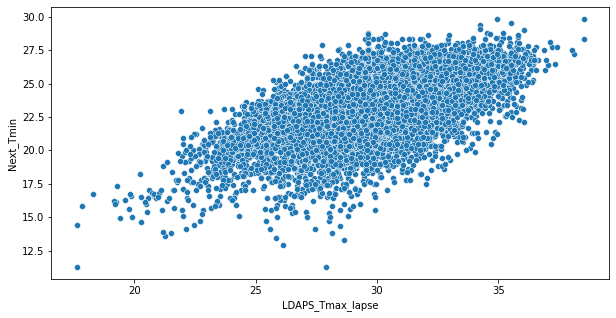

In [129]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_Tmax_lapse'], df['Next_Tmin'])

With increase in LDAPS_Tmax_lapse Next_Tmin is also increasing

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Next_Tmax'>

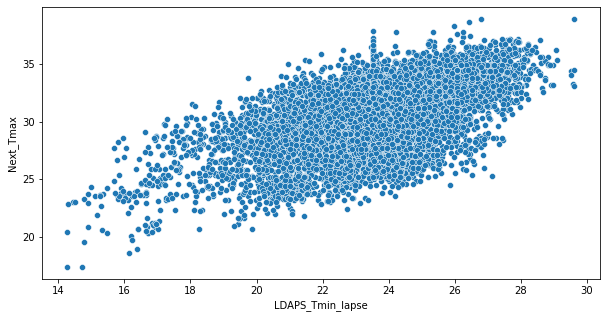

In [130]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_Tmin_lapse'], df['Next_Tmax'])

With increase in LDAPS_Tmin_lapse Next_Tmax is also increasing

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Next_Tmin'>

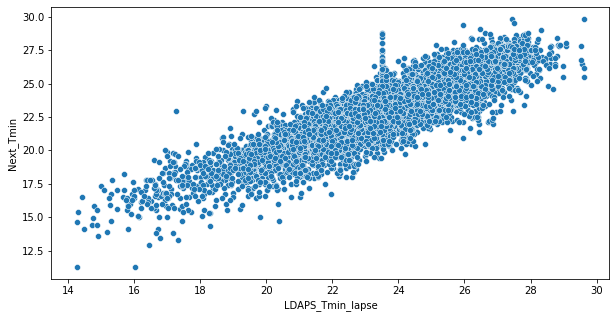

In [131]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_Tmin_lapse'], df['Next_Tmin'])

With increase in LDAPS_Tmin_lapse Next_Tmin is also increasing 

<AxesSubplot:xlabel='LDAPS_RHmax', ylabel='Next_Tmin'>

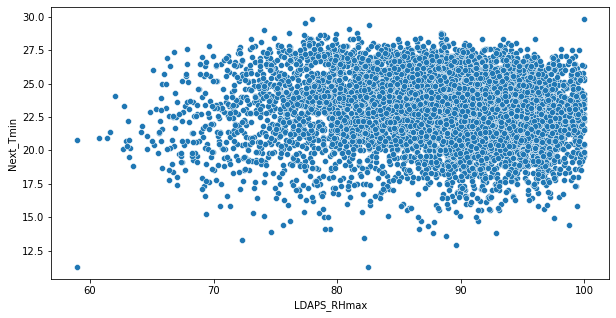

In [132]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_RHmax'], df['Next_Tmin'])

As we can see LDAPS_RHmax has higer density in between 90 to 100 and higher next_tmin

<AxesSubplot:xlabel='LDAPS_RHmax', ylabel='Next_Tmax'>

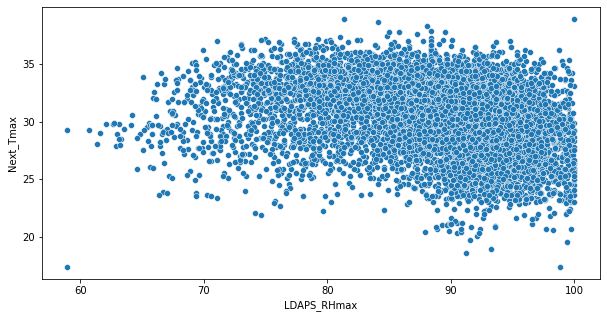

In [133]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_RHmax'], df['Next_Tmax'])

As we can see LDAPS_RHmax has higer density in between 90 to 100 and higher next_tmax

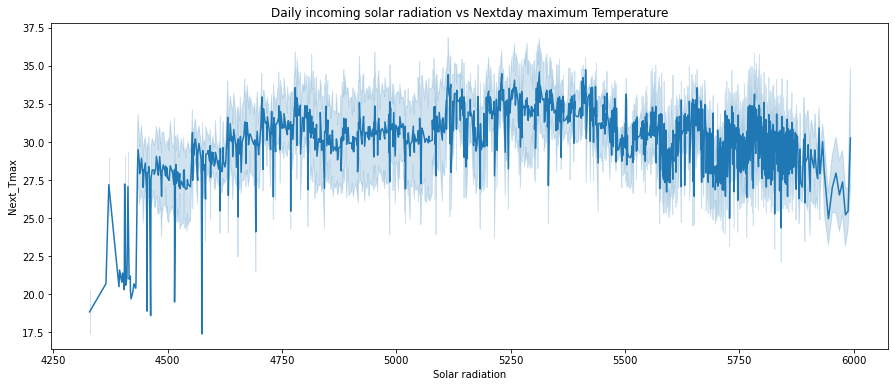

In [134]:
# comparing between Daily incoming solar radiation VS Next day maximum Temperature
plt.figure(figsize=(15,6))
plt.title('Daily incoming solar radiation vs Nextday maximum Temperature')
sns.lineplot(x='Solar radiation',y='Next_Tmax',data=df)
plt.show()

here we can see that the next day maximum temperature is frequently increases

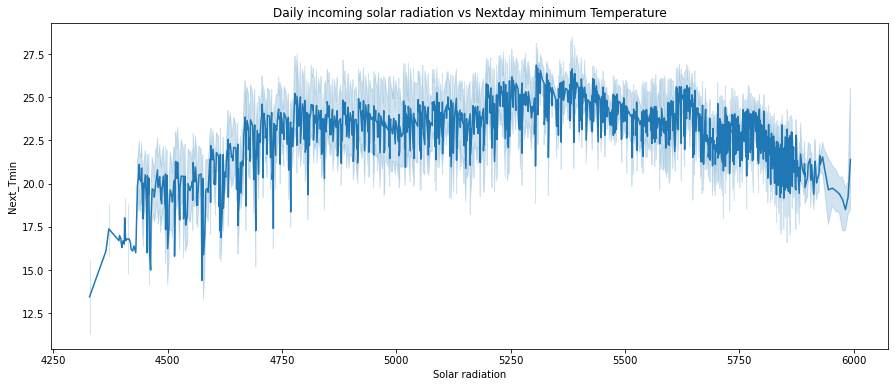

In [135]:
# comparing between Daily incoming solar radiation VS Next day minimum Temperature
plt.figure(figsize=(15,6))
plt.title('Daily incoming solar radiation vs Nextday minimum Temperature')
sns.lineplot(x='Solar radiation',y='Next_Tmin',data=df)
plt.show()

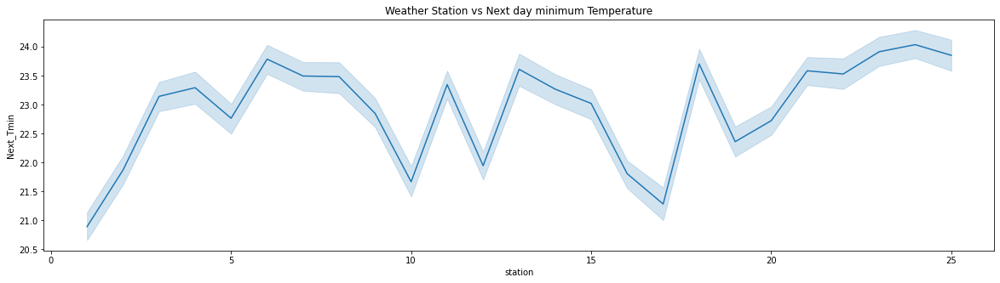

In [136]:
# comparing between weather station vs next day minimum Temperature
plt.figure(figsize=(20,5))
plt.title('Weather Station vs Next day minimum Temperature')
sns.lineplot(x='station',y='Next_Tmin',data=df)
plt.show()

here, we can see that,the line plot clears that next day minimum temparature is high & low at station 18 & 17 respectively

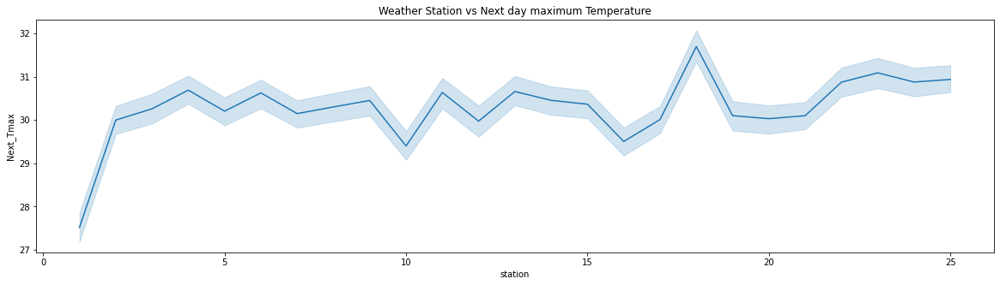

In [137]:
# comparing between weather station and next day maximum temperature
plt.figure(figsize=(20,5))
plt.title('Weather Station vs Next day maximum Temperature')
sns.lineplot(x='station',y='Next_Tmax',data=df)
plt.show()

here, we can see that,the line plot clears that next day maximum temparature is high & low at station 18 & 10 respectively.

Text(0, 0.5, 'Next_Tmax')

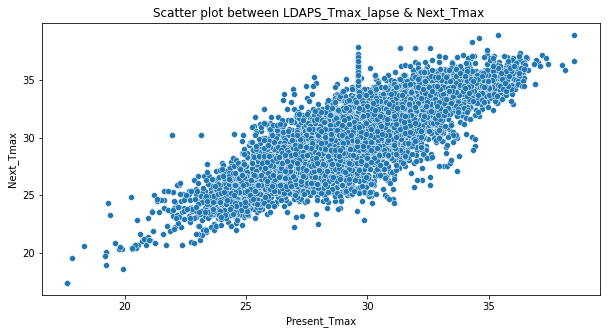

In [138]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_Tmax_lapse'], df['Next_Tmax'])
plt.title('Scatter plot between LDAPS_Tmax_lapse & Next_Tmax ')
plt.xlabel('Present_Tmax')
plt.ylabel('Next_Tmax')

as we can see that with LDAPS_Tmax lapse temperature is also getting higher like in linear format pattern.

Text(0, 0.5, 'Next_Tmin')

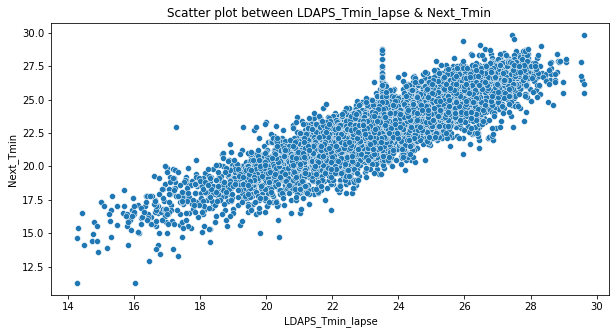

In [139]:
plt.figure(figsize=(10,5))
sns.scatterplot(df['LDAPS_Tmin_lapse'],df['Next_Tmin'])
plt.title('Scatter plot between LDAPS_Tmin_lapse & Next_Tmin ')
plt.xlabel('LDAPS_Tmin_lapse')
plt.ylabel('Next_Tmin')

we can see here with LDAPS_Tmin_lapse temp is also getting lower

Text(0, 0.5, 'Next_Tmin')

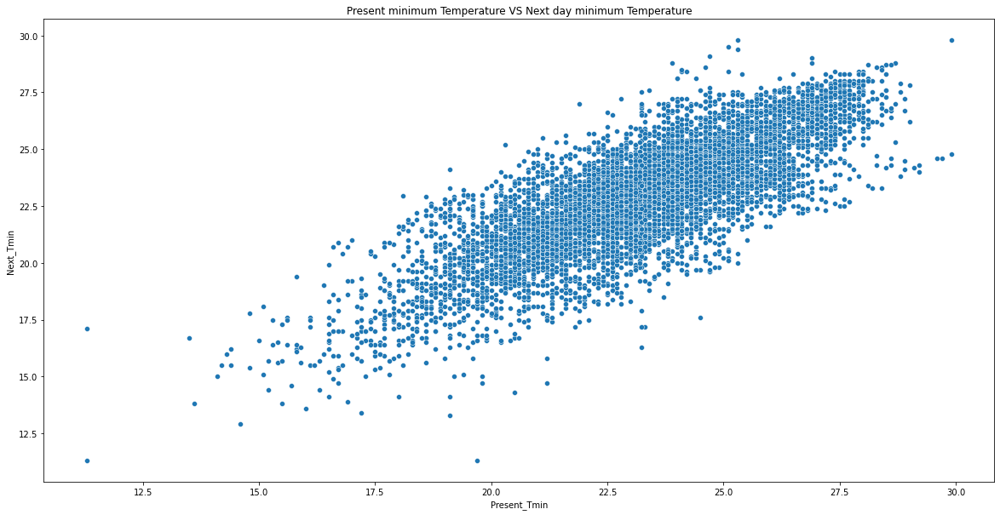

In [140]:
#Distribution data between Present minimun Temperature  vs Next day minimum Temperature.
plt.figure(figsize=(20,10))
plt.title('Present minimum Temperature VS Next day minimum Temperature')
sns.scatterplot(df['Present_Tmin'], df['Next_Tmin'])
plt.xlabel('Present_Tmin')
plt.ylabel('Next_Tmin')

here we can notice that when present _tmin is decreasing ,next_tmin also getting lower

Text(0, 0.5, 'Next_Tmax')

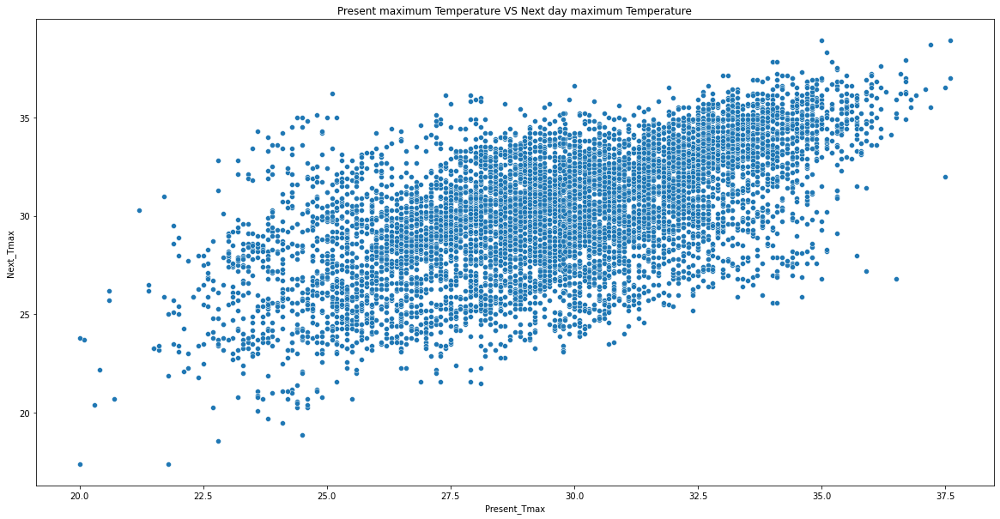

In [141]:
#Distribution data between Present maximum temperaturevs Next day maximum Temperature
plt.figure(figsize=(20,10))
plt.title('Present maximum Temperature VS Next day maximum Temperature')
sns.scatterplot(df['Present_Tmax'], df['Next_Tmax'])
plt.xlabel('Present_Tmax')
plt.ylabel('Next_Tmax')

here we can see that when present_tmax is increasing,next_tax is also is getting higher and it looks like linear pattern.

# Multivarient Analysis

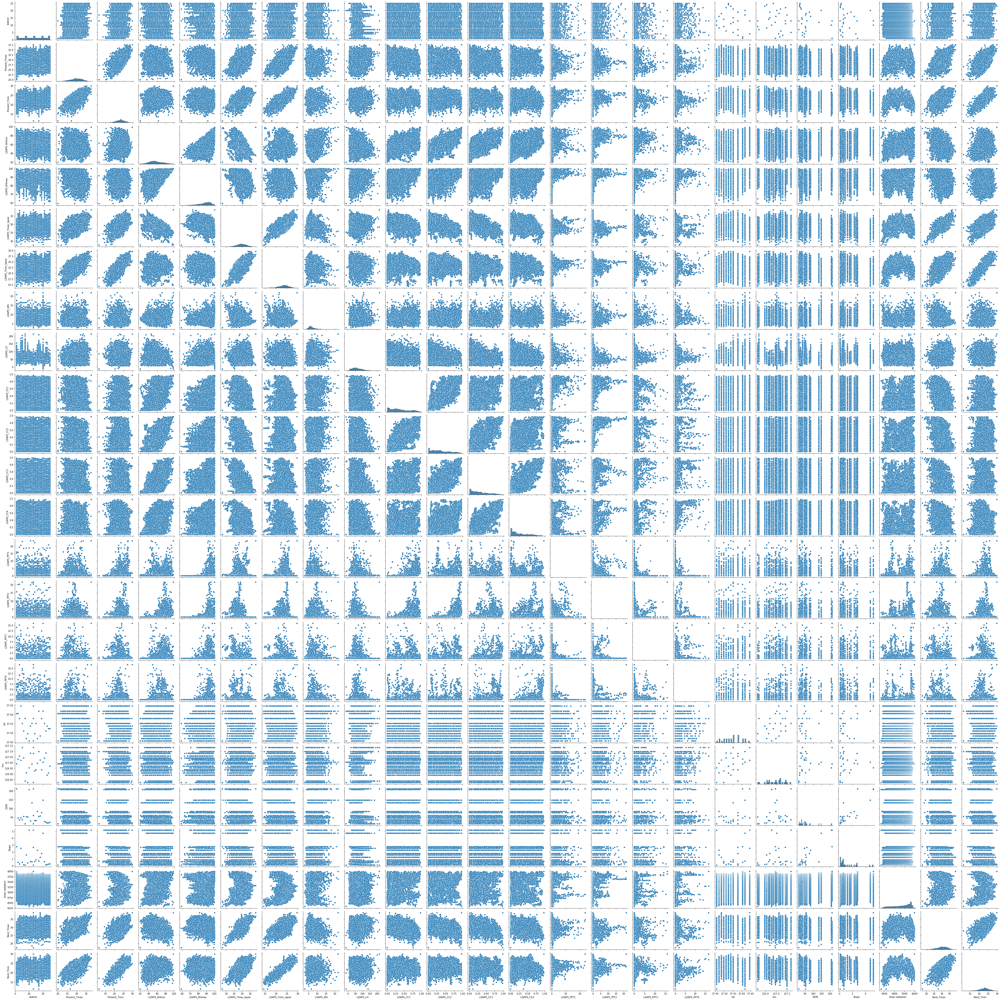

In [142]:
sns.pairplot(df)
plt.show()

A pairplot of the dataset provided 

In [143]:
import datetime as dt

# Convert the 'Date' column to datetime if it is not already in that format
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Remove any rows with missing or invalid datetime values
df = df.dropna(subset=['Date'])

# Convert the remaining datetime values to ordinals
df['Date'] = df['Date'].map(dt.datetime.toordinal)

# Checking for the outliers

In [144]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

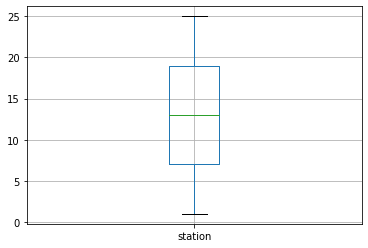

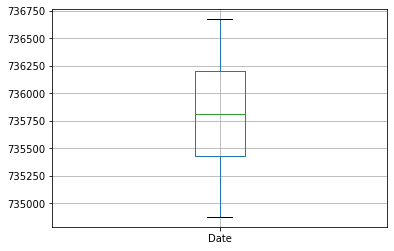

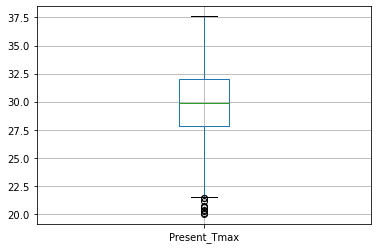

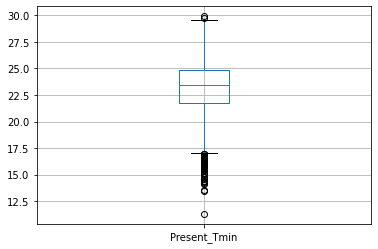

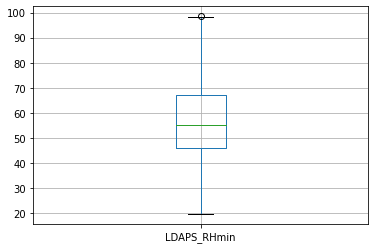

...

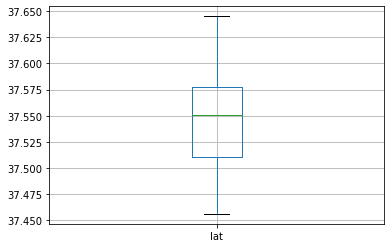

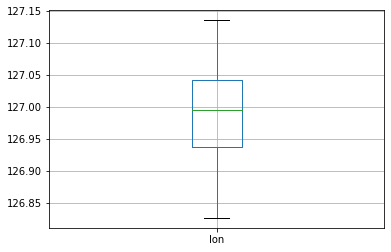

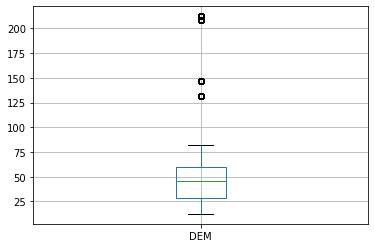

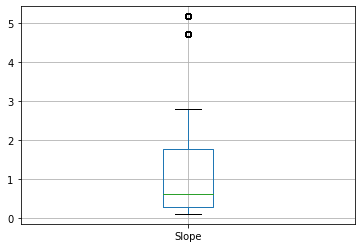

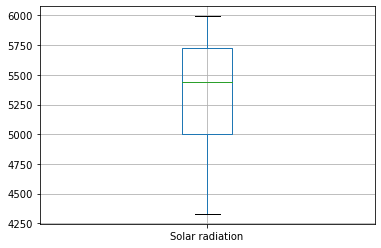

In [145]:
#checking for outliers by visualiztion 
col_list=['station','Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS','LDAPS_LH','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','lat','lon','DEM','Slope','Solar radiation']
for col in col_list:
    df.boxplot(col)
    plt.show()

By visualizing with boxplot we can say that outliers are present in the dataset.

# Removing Outliers

In [146]:
#Removing outliers
from scipy.stats import zscore
col_list=df[['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS','LDAPS_LH','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','lat','lon','DEM','Slope','Solar radiation']]
z=np.abs(zscore(col_list))

z

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,1.664101,0.361782,0.761303,0.102641,0.383191,0.525837,0.217124,0.128153,0.207567,0.516304,...,0.664903,0.307046,0.277548,0.241743,0.225419,1.189704,0.005038,2.773649,1.115761,1.518401
1,1.525426,0.721742,0.677906,0.308235,0.311618,0.080886,0.223971,0.648374,0.315028,0.548629,...,0.677556,0.307046,0.277548,0.241743,0.225419,1.189704,0.511327,0.315050,0.542139,1.230307
2,1.386750,0.620161,0.030967,0.553222,0.616001,0.163054,0.451635,0.442347,1.250882,0.610543,...,0.620645,0.307046,0.277548,0.241743,0.225419,0.653264,0.838778,0.526200,0.723195,1.216887
3,1.248075,0.755602,0.072665,0.101551,1.134018,0.031005,0.080153,0.667687,0.096430,0.583623,...,0.651778,0.307046,0.277548,0.241743,0.225419,1.992377,0.385384,0.297473,0.933099,1.201522
4,1.109400,0.552441,0.552811,0.040089,0.248725,0.170723,0.011375,0.628473,1.356743,0.832456,...,0.510381,0.307046,0.277548,0.241743,0.225419,0.118811,1.808536,0.494290,0.548418,1.207554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,1.109400,2.257950,2.262447,2.198944,1.415073,0.615110,2.235342,0.227689,1.577876,1.209753,...,1.165112,0.307046,0.277548,0.241743,0.225419,0.118811,0.612081,0.655386,0.499795,2.064311
7746,1.248075,2.461111,2.429240,1.828278,0.655669,0.993432,2.445137,0.613204,0.586358,1.157819,...,1.112549,0.307046,0.277548,0.241743,0.225419,0.685848,1.191417,0.735219,0.820220,2.097462
7747,1.386750,2.190230,2.554336,2.058222,1.329954,1.113925,2.032545,0.437410,0.285339,1.297344,...,1.182424,0.307046,0.277548,0.241743,0.225419,0.149408,1.264464,0.852800,0.804013,2.093941
7748,1.525426,2.190230,2.304145,2.243401,1.550262,0.889173,2.050634,0.255585,0.455147,1.274976,...,1.182424,0.307046,0.277548,0.241743,0.225419,0.417628,1.037767,0.821318,0.755171,2.105458


In [147]:
threshold=3

print(np.where(z>3))

(array([  25,   25,   26, ..., 7743, 7744, 7744], dtype=int64), array([ 7, 14, 14, ...,  2,  2,  6], dtype=int64))


In [148]:
df_new=df[(z<3).all(axis=1)]

df_new

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,735049,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,735049,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,735049,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,735049,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,735049,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,736571,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,...,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7746,22.0,736571,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,...,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7747,23.0,736571,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7748,24.0,736571,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8


In [149]:
df_new.shape

(6901, 25)

In [150]:
df.shape

(7750, 25)

In [151]:
#Checking dataloss
Dataloss = (((7752-6907)/7752)*100)
Dataloss

10.900412796697626

The data loss is approximately 10% which is in range so we can further proceed.

In [152]:
df=df_new

In [153]:
df.shape

(6901, 25)

# Skewness Handling

In [154]:
df.skew()

station             0.002263
Date                0.007804
Present_Tmax       -0.276364
Present_Tmin       -0.232814
LDAPS_RHmin         0.306253
LDAPS_RHmax        -0.685423
LDAPS_Tmax_lapse   -0.106441
LDAPS_Tmin_lapse   -0.397189
LDAPS_WS            1.086639
LDAPS_LH            0.566075
LDAPS_CC1           0.595338
LDAPS_CC2           0.502252
LDAPS_CC3           0.702271
LDAPS_CC4           0.711970
LDAPS_PPT1          3.727023
LDAPS_PPT2          4.864958
LDAPS_PPT3          5.481098
LDAPS_PPT4          5.931665
lat                 0.106073
lon                -0.276011
DEM                 1.762882
Slope               1.593858
Solar radiation    -0.503430
Next_Tmax          -0.268710
Next_Tmin          -0.294547
dtype: float64

Accpectable range is between -0.5 to +0.5 and here we can see that some columns have prescence of skewness.

#### Using Power transformer method to treat skewness

In [155]:
# removing skewness of the data
from sklearn.preprocessing import PowerTransformer
PT=PowerTransformer()
for i in df.columns:
    if abs(df.loc[:,i].skew())>0.5:
        df.loc[:,i]=PT.fit_transform(df.loc[:,i].values.reshape(-1,1))

In [156]:
df.skew()

station             0.002263
Date                0.007804
Present_Tmax       -0.276364
Present_Tmin       -0.232814
LDAPS_RHmin         0.306253
LDAPS_RHmax        -0.098562
LDAPS_Tmax_lapse   -0.106441
LDAPS_Tmin_lapse   -0.397189
LDAPS_WS            0.006187
LDAPS_LH           -0.030046
LDAPS_CC1           0.062828
LDAPS_CC2           0.047352
LDAPS_CC3           0.090615
LDAPS_CC4           0.138200
LDAPS_PPT1          1.550515
LDAPS_PPT2          1.740984
LDAPS_PPT3          1.904384
LDAPS_PPT4          2.160663
lat                 0.106073
lon                -0.276011
DEM                 0.038674
Slope               0.233843
Solar radiation    -0.166147
Next_Tmax          -0.268710
Next_Tmin          -0.294547
dtype: float64

we can see here skewness is removed, This best result we got cant handle can't treat more.

# Using LabelEncoder

In [157]:
from sklearn.preprocessing import LabelEncoder
lb=LabelEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=lb.fit_transform(df[i].values)

# Correlation between target variable and independent variables

In [158]:
cor=df.corr()

<AxesSubplot:>

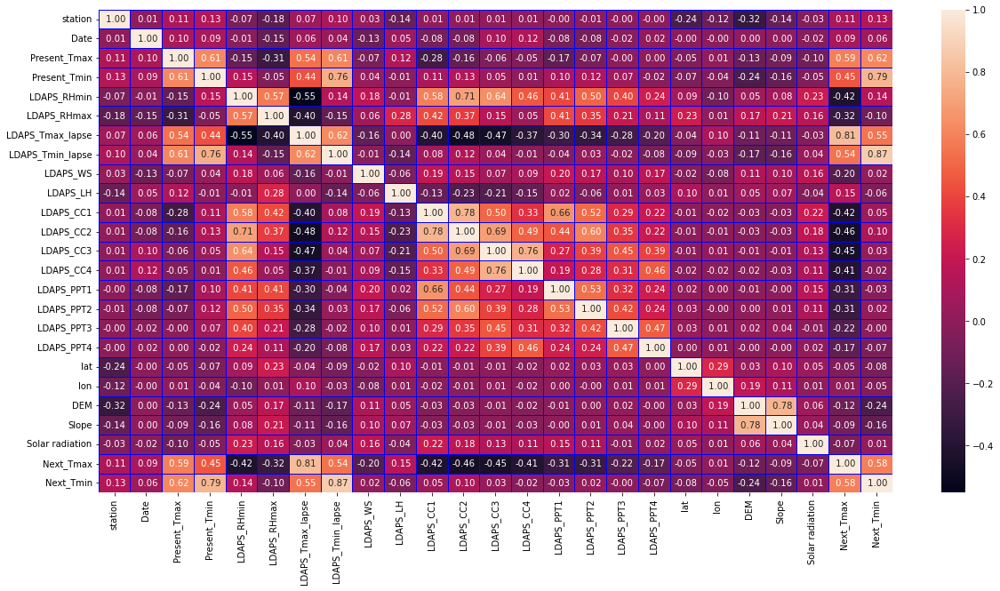

In [159]:
plt.figure(figsize=(20,10))

sns.heatmap(cor,annot= True,linewidths=1,linecolor='blue',fmt=' .2f' )

We can see here Present_Tmax and Present_Tmin are highly correlated with Target variables, LDAPS_RHmin and LDAPS_RHmax are also highly correlated with target variables, Next_Tmin and Next_Tmax are also highly correlated with exch other, most of the columns are negatively correlated with target variables.

# Seprating features and label

In [160]:
y1 = df["Next_Tmax"]
y2 = df["Next_Tmin"]
x = df.drop(["Next_Tmax","Next_Tmin"], axis=1)

# Feature Scalling Using Standard Scalarization

In [161]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-1.671666,-1.446101,-0.431369,-0.821595,0.194571,0.350929,-0.660940,-0.284648,0.170492,0.346279,...,-0.520342,-0.537426,-0.497325,-0.474752,-0.427536,1.213193,0.001493,1.853636,1.329496,1.886876
1,-1.532751,-1.446101,0.688394,-0.735213,-0.239012,0.263140,-0.011202,0.176837,-0.584168,-0.173849,...,-0.540544,-0.537426,-0.497325,-0.474752,-0.427536,1.213193,0.516082,0.068532,-0.374647,1.433219
2,-1.393837,-1.446101,0.583416,-0.000970,-0.497537,-0.723360,0.076792,0.415026,-0.260422,-1.390037,...,-0.450915,-0.537426,-0.497325,-0.474752,-0.427536,0.673012,0.842406,-0.354569,-0.943783,1.412931
3,-1.254922,-1.446101,0.723386,0.042220,0.193421,1.385573,-0.064619,-0.141346,-0.616457,0.241489,...,-0.499553,-0.537426,-0.497325,-0.474752,-0.427536,2.021465,0.390572,0.097594,1.250931,1.389794
4,-1.116007,-1.446101,0.513431,-0.605641,0.043954,0.187463,-0.280650,-0.069389,-0.551263,1.302097,...,-0.285969,-0.537426,-0.497325,-0.474752,-0.427536,0.134831,1.808829,-0.279960,-0.391175,1.398866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6896,1.106627,1.497149,-2.390953,-2.376462,-2.234208,-1.375192,-0.756542,-2.396162,0.041284,-2.024826,...,-1.460721,-0.537426,-0.497325,-0.474752,-0.427536,0.134831,0.616489,-0.713983,-0.268012,-1.766607
6897,1.245542,1.497149,-2.600909,-2.549225,-1.843057,-0.759732,-1.161687,-2.615655,-0.526266,0.684513,...,-1.346340,-0.537426,-0.497325,-0.474752,-0.427536,-0.675442,1.193833,-1.000558,-1.354064,-1.784601
6898,1.384456,1.497149,-2.320968,-2.678798,-2.085709,-1.313444,-1.290722,-2.183990,-0.253100,0.418009,...,-1.499329,-0.537426,-0.497325,-0.474752,-0.427536,-0.135260,-1.253601,-1.577383,-1.278804,-1.782700
6899,1.523371,1.497149,-2.320968,-2.419653,-2.281122,-1.469765,-1.050036,-2.202915,0.003916,-0.327153,...,-1.499329,-0.537426,-0.497325,-0.474752,-0.427536,-0.405351,-1.027684,-1.398370,-1.068913,-1.788909


We have scaled the data using standard scalarization method to overcome the issue of biasness we have use standard scaler which will convert dataset into mean=0 and std=1

Now we check for the multicolinearity for this we use Variance Inflation factor(VIF) method

# Checking for multicolinearity

In [162]:
# Find Varience Inflation Factor (VIF) in each scaled column above.

from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd


vif = pd.DataFrame()

vif['VIF values'] = [variance_inflation_factor(x.values, i)
              for i in range(len(x.columns))]
vif['Features'] = x.columns

vif

,VIF values,Features
0,1.287819,station
1,1.128476,Date
2,2.743147,Present_Tmax
3,3.069702,Present_Tmin
4,5.923913,LDAPS_RHmin
5,2.531941,LDAPS_RHmax
6,6.703082,LDAPS_Tmax_lapse
7,7.046470,LDAPS_Tmin_lapse
8,1.198536,LDAPS_WS
9,1.486000,LDAPS_LH


If vif value is greater than 10 than we can say that multicolinearity is present there but here vif values in all the columns are less than 10 so we can say that multicolinearity is not present in the dataset

# Modeling

### For Next_Tmax

In [163]:
from sklearn.linear_model import LinearRegression

from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

from sklearn.neighbors import KNeighborsRegressor

from sklearn.tree import DecisionTreeRegressor

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression 

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR

from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

# Linear Regression

### Finding Best Random State

In [164]:
lr = LinearRegression()

for i in range(500):
    x_train, x_test, y_train, y_test = train_test_split(x, y1, random_state=i, test_size=0.30)
    lr.fit(x_train, y_train)
    pred_train = lr.predict(x_train)
    pred_test = lr.predict(x_test)
    
    train_r2_score = round(r2_score(y_train, pred_train) * 100, 1)
    test_r2_score = round(r2_score(y_test, pred_test) * 100, 1)
    
    if train_r2_score == test_r2_score:
        print("At Random state", i, "The model performs very well")
        print("At random State:", i)
        print("Training r2_score:", train_r2_score)
        print("Testing r2 score:", test_r2_score)

At Random state 7 The model performs very well
At random State: 7
Training r2_score: 74.3
Testing r2 score: 74.3
At Random state 39 The model performs very well
At random State: 39
Training r2_score: 74.3
Testing r2 score: 74.3
At Random state 78 The model performs very well
At random State: 78
Training r2_score: 74.3
Testing r2 score: 74.3
At Random state 86 The model performs very well
At random State: 86
Training r2_score: 74.3
Testing r2 score: 74.3
At Random state 91 The model performs very well
At random State: 91
Training r2_score: 74.3
Testing r2 score: 74.3
At Random state 104 The model performs very well
At random State: 104
Training r2_score: 74.3
Testing r2 score: 74.3
At Random state 124 The model performs very well
At random State: 124
Training r2_score: 74.3
Testing r2 score: 74.3
At Random state 167 The model performs very well
At random State: 167
Training r2_score: 74.3
Testing r2 score: 74.3
At Random state 202 The model performs very well
At random State: 202
Traini

At random State: 464 Training r2_score 74.3 Testing r2 score 74.3

In [165]:
x_train, x_test, y_train, y_test= train_test_split(x,y1, test_size=0.30, random_state= 464)

In [166]:
lr.fit(x_train,y_train)
pred_test=lr.predict(x_test)

print('Linear model accuracy is: ',r2_score(y_test,pred_test))

Linear model accuracy is:  0.7427519636145014


In [167]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,pred_test))
print('Mean Squared Error:', mean_squared_error(y_test,pred_test))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,pred_test)))

Error:
Mean Absolute Error: 1.138988225877882
Mean Squared Error: 2.230291707981015
Root Mean Square Error: 1.4934161201691292


### Cross Validation For Linear Regression

In [168]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score

test_accuracy = r2_score(y_test, pred_test)

for i in range(2, 10):
    cv_score = cross_val_score(lr, x, y1, cv=i, scoring='r2')
    cv_mean = cv_score.mean()
    print(f"At cross fold {i}, the Cross Val score is {cv_mean * 100} and the Accuracy score is {test_accuracy * 100}")

At cross fold 2, the Cross Val score is 55.13787655300422 and the Accuracy score is 74.27519636145014
At cross fold 3, the Cross Val score is 63.513436224915665 and the Accuracy score is 74.27519636145014
At cross fold 4, the Cross Val score is 65.73399385123894 and the Accuracy score is 74.27519636145014
At cross fold 5, the Cross Val score is 63.634402090915145 and the Accuracy score is 74.27519636145014
At cross fold 6, the Cross Val score is 64.3674383882345 and the Accuracy score is 74.27519636145014
At cross fold 7, the Cross Val score is 65.7523401120834 and the Accuracy score is 74.27519636145014
At cross fold 8, the Cross Val score is 65.27719453861896 and the Accuracy score is 74.27519636145014
At cross fold 9, the Cross Val score is 58.78397890963674 and the Accuracy score is 74.27519636145014


we will choose At cross fold 8, the Cross Val score is 65.27719453861896 and the Accuracy score is 74.27519636145014

In [169]:
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(cv_score.mean()))

Difference between R2 score and cross validatio score is :   0.154912174518134


# Lasso

In [170]:
ls=Lasso()
ls.fit(x_train, y_train)
ls.score(x_train, y_train)
ls_pred=ls.predict(x_test)

lsd=r2_score(y_test, ls_pred)
print('R2 score:', lsd*100)

rdscore= cross_val_score(ls,x,y1,cv=8,scoring='r2')
lsc=rdscore.mean()
print('Cross val Score :', lsc*100)

R2 score: 52.86198536002132
Cross val Score : 44.75349687404982


In [171]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,ls_pred))
print('Mean Squared Error:', mean_squared_error(y_test,ls_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,ls_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(rdscore.mean()))

Error:
Mean Absolute Error: 1.5934570963386674
Mean Squared Error: 4.086776507972542
Root Mean Square Error: 2.0215777274130575
Difference between R2 score and cross validatio score is :   0.29521699487400316


# Ridge

In [172]:
rd= Ridge()
rd.fit(x_train, y_train)
rd.score(x_train, y_train)
rd_pred= rd.predict(x_test)

rds=r2_score(y_test, rd_pred)
print('r2 score: ', rds*100)

rdcvscore= cross_val_score(rd,x,y1,cv=8, scoring='r2')
rdcv=rdcvscore.mean()
print('Cross val Score', rdcv*100)

r2 score:  74.27728943030729
Cross val Score 65.27991236921744


In [173]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,rd_pred))
print('Mean Squared Error:', mean_squared_error(y_test,rd_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,rd_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(rdcvscore.mean()))

Error:
Mean Absolute Error: 1.1388980114372342
Mean Squared Error: 2.230110242879009
Root Mean Square Error: 1.4933553638966879
Difference between R2 score and cross validatio score is :   0.08995283992232694


# Decision TreeRegressor

In [174]:
dt=DecisionTreeRegressor()
dt.fit(x_train, y_train)
dt.score(x_train, y_train)
dt_pred=dt.predict(x_test)

dt_score=r2_score(y_test, dt_pred)
print('R2 Score:', dt_score*100)

dtcvscore=cross_val_score(dt,x,y1,cv=8, scoring='r2')
dtcv=dtcvscore.mean()
print('Cross Val Score:', dtcv*100)

R2 Score: 74.11730643283234
Cross Val Score: 35.52846994983377


In [175]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,dt_pred))
print('Mean Squared Error:', mean_squared_error(y_test,dt_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,dt_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(dtcvscore.mean()))

Error:
Mean Absolute Error: 1.069241255807194
Mean Squared Error: 2.2439804654742805
Root Mean Square Error: 1.497992144663743
Difference between R2 score and cross validatio score is :   0.38746726411616367


# KNeighborsRegressor

In [176]:
kn=KNeighborsRegressor()
kn.fit(x_train, y_train)
kn.score(x_train,y_train)
kn_pred=kn.predict(x_test)

kn_score= r2_score(y_test, kn_pred)
print('R2 Score:', kn_score*100)

kn_cvscore=cross_val_score(kn,x,y1, cv=8, scoring='r2')
cv_mean=kn_cvscore.mean()
print('Cross val Score :',cv_mean*100 )

R2 Score: 84.45246868752582
Cross val Score : 48.47448832405727


In [177]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,kn_pred))
print('Mean Squared Error:', mean_squared_error(y_test,kn_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,kn_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(kn_cvscore.mean()))

Error:
Mean Absolute Error: 0.8666224374510695
Mean Squared Error: 1.3479414907495506
Root Mean Square Error: 1.1610088245786725
Difference between R2 score and cross validatio score is :   0.25800708037392867


# RandomForestRegressor

In [178]:
rf=RandomForestRegressor()
rf.fit(x_train, y_train)
rf.score(x_train,y_train)
rf_pred=rf.predict(x_test)

rf_score= r2_score(y_test, rf_pred)
print('R2 score:', rf_score*100)

rfcv=cross_val_score(rf,x,y1, cv=8, scoring='r2')
rfcvscore=rfcv.mean()
print('Cross val Score :',rfcvscore*100 )

R2 score: 89.11733599401526
Cross val Score : 64.41530014068155


In [179]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,rf_pred))
print('Mean Squared Error:', mean_squared_error(y_test,rf_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,rf_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(rfcv.mean()))

Error:
Mean Absolute Error: 0.721540801545147
Mean Squared Error: 0.9435063386419474
Root Mean Square Error: 0.971342544441428
Difference between R2 score and cross validatio score is :   0.09859896220768583


# GradientBoostingRegressor

In [180]:
from sklearn.ensemble import GradientBoostingRegressor
gb=GradientBoostingRegressor()
gb.fit(x_train, y_train)
gb.score(x_train,y_train)
gb_pred=rf.predict(x_test)

gb_score= r2_score(y_test, rf_pred)
print('R2 score:', gb_score*100)

gbcv=cross_val_score(gb,x,y1, cv=8, scoring='r2')
gbcvscore=gbcv.mean()
print('Cross val Score :', gb_score*100 )

R2 score: 89.11733599401526
Cross val Score : 89.11733599401526


In [181]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,gb_pred))
print('Mean Squared Error:', mean_squared_error(y_test,gb_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,gb_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(gbcv.mean()))

Error:
Mean Absolute Error: 0.721540801545147
Mean Squared Error: 0.9435063386419474
Root Mean Square Error: 0.971342544441428
Difference between R2 score and cross validatio score is :   0.059011029837959916


# SVR

In [182]:
sv=SVR()
sv.fit(x_train, y_train)
sv.score(x_train, y_train)
sv_pred=sv.predict(x_test)

svd=r2_score(y_test, sv_pred)
print('R2 score:', svd*100)

svscore= cross_val_score(sv,x,y1,cv=8,scoring='r2')
svc=svscore.mean()
print('Cross val Score :', svc*100)

R2 score: 86.91907679340716
Cross val Score : 64.52570361109291


In [183]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,gb_pred))
print('Mean Squared Error:', mean_squared_error(y_test,gb_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,gb_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(svscore.mean()))

Error:
Mean Absolute Error: 0.721540801545147
Mean Squared Error: 0.9435063386419474
Root Mean Square Error: 0.971342544441428
Difference between R2 score and cross validatio score is :   0.09749492750357225


# Selection for the final model

After trying all the different- different we reached at the conclusion that GradientBoostingRegressor is perfroming very good among all the other models as R2score= 89.11733599401526 & Cross val Score=89.11733599401526 and Difference between R2 score and cross validatio score is= 0.059011029837959916. Which is minimum among all the other model so we will select GradientBoostingRegressor as our final model 

# Perfrom HyperparaMeter Tuning

In [184]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 4, 6],
    'min_samples_leaf': [1, 2, 3]
}

# Create an instance of GradientBoostingRegressor
gbr = GradientBoostingRegressor()

# Create GridSearchCV instance with the necessary parameters
grid_search = GridSearchCV(gbr, param_grid, cv=5, scoring='r2')

# Fit the GridSearchCV to perform hyperparameter tuning
grid_search.fit(x, y1)

# Print the best hyperparameters and the corresponding score
print("Best Parameters: ", grid_search.best_params_)
print("Best Score: ", grid_search.best_score_)

Best Parameters:  {'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 100}
Best Score:  0.688116814636398


In [213]:
gb=GradientBoostingRegressor(learning_rate=0.1, max_depth= 3, min_samples_leaf= 1, min_samples_split= 4, n_estimators= 100)
gb.fit(x_train, y_train)
gb.score(x_train,y_train)
gb_pred=rf.predict(x_test)

gb_score= r2_score(y_test, gb_pred)
print('R2 score:', gb_score*100)

gbcv=cross_val_score(gb,x,y1, cv=8, scoring='r2')
gbcvscore=gbcv.mean()
print('Cross val Score :',gbcvscore*100)

R2 score: 88.9996100691476
Cross val Score : 68.3873355929503


# Saving Best Model

In [186]:
import joblib

joblib.dump(gb, 'Temperature_Tmax.pkl')

['Temperature_Tmax.pkl']

# Predicting Saved Model

In [187]:
model=joblib.load('Temperature_Tmax.pkl')

#Predict

prediction = model.predict(x_test)

prediction

array([32.47133944, 30.66584918, 34.65293612, ..., 28.31414606,
       30.55037783, 30.17096347])

In [188]:
pd.DataFrame([model.predict(x_test)[:], y_test[:]], index = ['Predicted', 'Original'])

,0,1,2,3,4,5,6,7,8,9,...,2061,2062,2063,2064,2065,2066,2067,2068,2069,2070
Predicted,32.471339,30.665849,34.652936,31.204002,31.424368,27.125579,26.168665,30.949596,34.242551,28.485694,...,29.348378,30.218333,32.118356,31.437304,28.301307,32.772702,28.503275,28.314146,30.550378,30.170963
Original,32.400000,31.300000,34.000000,31.100000,32.000000,27.200000,25.800000,30.800000,33.000000,25.100000,...,29.400000,28.900000,32.100000,30.500000,28.600000,32.800000,29.500000,27.700000,32.000000,28.900000


Here we can see that the predicted values and original values are almost similiar so our model is working fine.

# Let's try for Next_Tmin

# Linear Regression

### Finding Best Random State

In [189]:
lr = LinearRegression()

for i in range(500):
    x_train, x_test, y_train, y_test = train_test_split(x, y2, random_state=i, test_size=0.30)
    lr.fit(x_train, y_train)
    pred_train = lr.predict(x_train)
    pred_test = lr.predict(x_test)
    
    train_r2_score = round(r2_score(y_train, pred_train) * 100, 1)
    test_r2_score = round(r2_score(y_test, pred_test) * 100, 1)
    
    if train_r2_score == test_r2_score:
        print("At Random state", i, "The model performs very well")
        print("At random State:", i)
        print("Training r2_score:", train_r2_score)
        print("Testing r2 score:", test_r2_score)

At Random state 18 The model performs very well
At random State: 18
Training r2_score: 81.2
Testing r2 score: 81.2
At Random state 25 The model performs very well
At random State: 25
Training r2_score: 81.2
Testing r2 score: 81.2
At Random state 55 The model performs very well
At random State: 55
Training r2_score: 81.2
Testing r2 score: 81.2
At Random state 66 The model performs very well
At random State: 66
Training r2_score: 81.2
Testing r2 score: 81.2
At Random state 104 The model performs very well
At random State: 104
Training r2_score: 81.2
Testing r2 score: 81.2
At Random state 163 The model performs very well
At random State: 163
Training r2_score: 81.2
Testing r2 score: 81.2
At Random state 173 The model performs very well
At random State: 173
Training r2_score: 81.2
Testing r2 score: 81.2
At Random state 209 The model performs very well
At random State: 209
Training r2_score: 81.2
Testing r2 score: 81.2
At Random state 224 The model performs very well
At random State: 224
Tr

At random State: 18 Training r2_score 81.2 Testing r2 score 81.2

In [190]:
x_train, x_test, y_train, y_test= train_test_split(x,y2, test_size=0.30, random_state= 18)

In [191]:
lr.fit(x_train,y_train)
pred_test=lr.predict(x_test)

print('Linear model accuracy is: ',r2_score(y_test,pred_test))

Linear model accuracy is:  0.8119570112714507


In [192]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,pred_test))
print('Mean Squared Error:', mean_squared_error(y_test,pred_test))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,pred_test)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(cv_score.mean()))

Error:
Mean Absolute Error: 0.8000221825817325
Mean Squared Error: 1.0544030819996102
Root Mean Square Error: 1.0268413129591203
Difference between R2 score and cross validatio score is :   0.22411722217508334


### Cross Validation For Linear Regression¶

In [193]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score

test_accuracy = r2_score(y_test, pred_test)

for i in range(2, 10):
    cv_score = cross_val_score(lr, x, y2, cv=i, scoring='r2')
    cv_mean = cv_score.mean()
    print(f"At cross fold {i}, the Cross Val score is {cv_mean * 100} and the Accuracy score is {test_accuracy * 100}")

At cross fold 2, the Cross Val score is 78.48846043225441 and the Accuracy score is 81.19570112714507
At cross fold 3, the Cross Val score is 75.04767460945946 and the Accuracy score is 81.19570112714507
At cross fold 4, the Cross Val score is 76.74573299838036 and the Accuracy score is 81.19570112714507
At cross fold 5, the Cross Val score is 74.9889029466131 and the Accuracy score is 81.19570112714507
At cross fold 6, the Cross Val score is 72.97526372363305 and the Accuracy score is 81.19570112714507
At cross fold 7, the Cross Val score is 74.32334972180429 and the Accuracy score is 81.19570112714507
At cross fold 8, the Cross Val score is 75.68177542047079 and the Accuracy score is 81.19570112714507
At cross fold 9, the Cross Val score is 66.42208501512023 and the Accuracy score is 81.19570112714507


 we choose At cross fold 8, the Cross Val score is 75.68177542047079 and the Accuracy score is 81.19570112714507

# Lasso

In [194]:
ls=Lasso()
ls.fit(x_train, y_train)
ls.score(x_train, y_train)
ls_pred=ls.predict(x_test)

lsd=r2_score(y_test, ls_pred)
print('R2 score:', lsd*100)

rdscore= cross_val_score(ls,x,y2,cv=8,scoring='r2')
lsc=rdscore.mean()
print('Cross val Score :', lsc*100)

R2 score: 59.72591193510919
Cross val Score : 51.77096693787586


In [195]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,ls_pred))
print('Mean Squared Error:', mean_squared_error(y_test,ls_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,ls_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(rdscore.mean()))

Error:
Mean Absolute Error: 1.2029619023431557
Mean Squared Error: 2.2582667329142168
Root Mean Square Error: 1.5027530512077547
Difference between R2 score and cross validatio score is :   0.2942473418926921


# Ridge

In [196]:
rd= Ridge()
rd.fit(x_train, y_train)
rd.score(x_train, y_train)
rd_pred= rd.predict(x_test)

rds=r2_score(y_test, rd_pred)
print('r2 score: ', rds*100)

rdcvscore= cross_val_score(rd,x,y2,cv=8, scoring='r2')
rdcv=rdcvscore.mean()
print('Cross val Score', rdcv*100)

r2 score:  81.19567948678551
Cross val Score 75.68296308571104


In [197]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,rd_pred))
print('Mean Squared Error:', mean_squared_error(y_test,rd_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,rd_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(rdcvscore.mean()))

Error:
Mean Absolute Error: 0.8000313816949884
Mean Squared Error: 1.0544042954275594
Root Mean Square Error: 1.02684190381361
Difference between R2 score and cross validatio score is :   0.0551273804143404


# Decision TreeRegressor

In [198]:
dt=DecisionTreeRegressor()
dt.fit(x_train, y_train)
dt.score(x_train, y_train)
dt_pred=dt.predict(x_test)

dt_score=r2_score(y_test, dt_pred)
print('R2 Score:', dt_score*100)

dtcvscore=cross_val_score(dt,x,y2,cv=8, scoring='r2')
dtcv=dtcvscore.mean()
print('Cross Val Score:', dtcv*100)

R2 Score: 75.9798292006011
Cross Val Score: 55.388180550316534


In [199]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,dt_pred))
print('Mean Squared Error:', mean_squared_error(y_test,dt_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,dt_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(dtcvscore.mean()))

Error:
Mean Absolute Error: 0.8451971703552996
Mean Squared Error: 1.346869792502826
Root Mean Square Error: 1.1605471952931625
Difference between R2 score and cross validatio score is :   0.25807520576828535


# KNeighborsRegressor

In [200]:
kn=KNeighborsRegressor()
kn.fit(x_train, y_train)
kn.score(x_train,y_train)
kn_pred=kn.predict(x_test)

kn_score= r2_score(y_test, kn_pred)
print('R2 Score:', kn_score*100)

kn_cvscore=cross_val_score(kn,x,y2, cv=8, scoring='r2')
cv_mean=kn_cvscore.mean()
print('Cross val Score :',cv_mean*100 )

R2 Score: 85.45046638041032
Cross val Score : 60.84412248865988


In [201]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,kn_pred))
print('Mean Squared Error:', mean_squared_error(y_test,kn_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,kn_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(kn_cvscore.mean()))

Error:
Mean Absolute Error: 0.6999430245695294
Mean Squared Error: 0.8158279760325451
Root Mean Square Error: 0.9032319613657087
Difference between R2 score and cross validatio score is :   0.2035157863848519


# RandomForestRegressor

In [202]:
rf=RandomForestRegressor()
rf.fit(x_train, y_train)
rf.score(x_train,y_train)
rf_pred=rf.predict(x_test)

rf_score= r2_score(y_test, rf_pred)
print('R2 score:', rf_score*100)

rfcv=cross_val_score(rf,x,y2, cv=8, scoring='r2')
rfcvscore=rfcv.mean()
print('Cross val Score :',rfcvscore*100 )

R2 score: 88.9996100691476
Cross val Score : 77.48682813952985


In [203]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,rf_pred))
print('Mean Squared Error:', mean_squared_error(y_test,rf_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,rf_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(rfcv.mean()))

Error:
Mean Absolute Error: 0.6027781563555272
Mean Squared Error: 0.6168187989732417
Root Mean Square Error: 0.7853781248374834
Difference between R2 score and cross validatio score is :   0.03708872987615219


# GradientBoostingRegressor

In [204]:
from sklearn.ensemble import GradientBoostingRegressor
gb=GradientBoostingRegressor()
gb.fit(x_train, y_train)
gb.score(x_train,y_train)
gb_pred=rf.predict(x_test)

gb_score= r2_score(y_test, rf_pred)
print('R2 score:', gb_score*100)

gbcv=cross_val_score(gb,x,y2, cv=8, scoring='r2')
gbcvscore=gbcv.mean()
print('Cross val Score :', gb_score*100 )

R2 score: 88.9996100691476
Cross val Score : 88.9996100691476


In [205]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,gb_pred))
print('Mean Squared Error:', mean_squared_error(y_test,gb_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,gb_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(gbcv.mean()))

Error:
Mean Absolute Error: 0.6027781563555272
Mean Squared Error: 0.6168187989732417
Root Mean Square Error: 0.7853781248374834
Difference between R2 score and cross validatio score is :   0.03604207908947166


# SVR

In [206]:
sv=SVR()
sv.fit(x_train, y_train)
sv.score(x_train, y_train)
sv_pred=sv.predict(x_test)

svd=r2_score(y_test, sv_pred)
print('R2 score:', svd*100)

svscore= cross_val_score(sv,x,y2,cv=8,scoring='r2')
svc=svscore.mean()
print('Cross val Score :', svc*100)

R2 score: 90.05913152484635
Cross val Score : 71.4356998749863


In [207]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,gb_pred))
print('Mean Squared Error:', mean_squared_error(y_test,gb_pred))
print('Root Mean Square Error:', np.sqrt(mean_squared_error(y_test,gb_pred)))
print("Difference between R2 score and cross validatio score is :  ",r2_score(y_test, pred_test)-abs(svscore.mean()))

Error:
Mean Absolute Error: 0.6027781563555272
Mean Squared Error: 0.6168187989732417
Root Mean Square Error: 0.7853781248374834
Difference between R2 score and cross validatio score is :   0.09760001252158768


# Selection for the final model

After trying all the different- different we reached at the conclusion that SVR is perfroming very good among all the other models as R2score= 90.05913152484635 & Cross val Score= 71.4356998749863 and Difference between R2 score and cross validatio score is=  0.09760001252158768. Which is minimum among all the other model so we will select SVR as our final model

# Hyperparameter Tuning 

In [208]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR

# Define the parameter grid
param_grid = {
    'kernel': ['linear', 'rbf'],
    'C': [0.1, 1, 10],
    'epsilon': [0.1, 0.2, 0.3]
}

model = SVR()

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(x, y2)

# Print the best parameters and best score
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

Best parameters:  {'C': 0.1, 'epsilon': 0.3, 'kernel': 'linear'}
Best score:  0.7470568934896583


In [209]:
from sklearn.svm import SVR
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score

model = SVR(C=0.1, epsilon=0.3, kernel='linear')
model.fit(x_train, y_train)
model_score = model.score(x_train, y_train)
model_pred = model.predict(x_test)
model_r2_score = r2_score(y_test, model_pred)
print('R2 score:', model_r2_score * 100)

model_cv = cross_val_score(model, x, y2, cv=8, scoring='r2')
model_cv_score = model_cv.mean()
print('Cross val Score:', model_cv_score * 100)

R2 score: 81.10417923717831
Cross val Score: 75.63951295260361


# Saving Best Model

In [210]:
import joblib

joblib.dump(gb, 'Temperature_Tmin.pkl')

['Temperature_Tmin.pkl']

# Predicting Saved Model

In [211]:
model=joblib.load('Temperature_Tmin.pkl')

#Predict

prediction = model.predict(x_test)

prediction

array([23.64027546, 24.89927538, 23.33439446, ..., 21.19881019,
       22.19921753, 21.27946648])

In [212]:
pd.DataFrame([model.predict(x_test)[:], y_test[:]], index = ['Predicted', 'Original'])

,0,1,2,3,4,5,6,7,8,9,...,2061,2062,2063,2064,2065,2066,2067,2068,2069,2070
Predicted,23.640275,24.899275,23.334394,25.053115,25.542202,20.635249,24.76528,26.078372,23.711638,23.01512,...,21.211415,23.395669,23.457028,21.306517,19.719974,23.381321,24.264459,21.19881,22.199218,21.279466
Original,23.900000,26.300000,23.700000,26.900000,26.200000,21.800000,26.10000,26.400000,22.700000,22.70000,...,20.300000,22.800000,25.000000,19.500000,18.700000,24.200000,24.800000,21.30000,23.100000,22.300000


# Conclusion

Here we can say that for both of the case in next day max temp. and next day min. temp our  predicted value and original values are almot similiar so our model is perfroming good. 